In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from gpflow.utilities import print_summary, set_trainable, to_default_float
import gpflow
import tensorflow as tf
import tensorflow_probability as tfp
tfd = tfp.distributions

import os
os.environ["CUDA_VISIBLE_DEVICES"] = '4'

from sklearn.metrics import mean_squared_error, mean_absolute_error

import sys
sys.path.append('../../src')
from data_preparation import get_birth_data, separate_data
from useful_fun import plot_distribution, percentage_outof_CI

In [2]:
# load data

# whole dataset
data = get_birth_data()
x, y = separate_data(data, train_test=False)

# train/test split
df_train = pd.read_csv('../../data/train.csv')
x_train, y_train = separate_data(df_train)
df_test = pd.read_csv('../../data/test.csv')
x_test, y_test = separate_data(df_test)

# get date for x-axis in plots
def get_xticks(data):
    idss = []; yrs = []
    yr = 1969
    for i in range(20):
        df = data.loc[data.year == yr+i]
        yrs.append(yr+i)
        idss.append(df.index[0])
    return idss, yrs
pos, labels = get_xticks(data)

2022-08-14 16:48:42.934641: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-08-14 16:48:43.571525: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9646 MB memory:  -> device: 0, name: GeForce RTX 2080 Ti, pci bus id: 0000:b1:00.0, compute capability: 7.5


# Effects of lengthscale starting values and priors

We are trying to find the optimal lengthscale for our models. We seem to get very varied results when changing the epochs, the starting value and priors. This notebook aims to find (ideally) a prior that fixes this inconsistency. We will try:

1. Different priors both gamma and inverse-gamma with different parameter
2. Plotting the ELBO so possibly undetand what is happening better

In [ ]:
def optimise_predict_model(model, epochs=50):
    ELBO = []; ls = []

    train_data = (x_train, y_train)
    loss_fn = model.training_loss_closure(train_data) 

    gpflow.utilities.set_trainable(model.q_mu, False)
    gpflow.utilities.set_trainable(model.q_sqrt, False)

    variational_vars = [(model.q_mu, model.q_sqrt)]
    natgrad_opt = gpflow.optimizers.NaturalGradient(gamma=0.1)
    adam_vars = model.trainable_variables
    adam_opt = tf.optimizers.Adam(0.01)

    @tf.function
    def optimisation_step():
        natgrad_opt.minimize(loss_fn, variational_vars)
        adam_opt.minimize(loss_fn, adam_vars)

    for epoch in range(1, epochs + 1):
        optimisation_step()
        ELBO.append(loss_fn().numpy())
        ls.append(model.kernel.lengthscales)
    
    # fitted values
    mean_train, var_train = model.predict_f(x_train)
    print('Train')
    plot_distribution(x_train, y_train, mean_train, var_train, pos, labels, legend=False)

    # predict
    mean_test, var_test = model.predict_f(x_test)
    print('Test')
    plot_distribution(x_test, y_test, mean_test, var_test, pos, labels)

    print('train ELBO, MSE, MAE: ', model.elbo((x_train,y_train)).numpy(), mean_squared_error(y_train, mean_train), mean_absolute_error(y_train, mean_train))
    print('test ELBO, MSE, MAE: ', model.elbo((x_test,y_test)).numpy(), mean_squared_error(y_test, mean_test), mean_absolute_error(y_test, mean_test))
    print('percentage out of CI (train, test): ', percentage_outof_CI(y_train, mean_train, var_train), percentage_outof_CI(y_test, mean_test, var_test))

    print_summary(model, fmt='notebook')

    return ELBO, ls

Different distributions

No handles with labels found to put in legend.


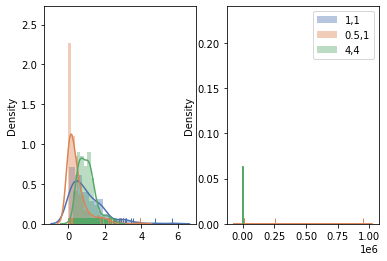

In [6]:
import warnings
warnings.filterwarnings("ignore")

# distribution of priors
g1 = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
g2 = tfp.distributions.Gamma(to_default_float(0.5), to_default_float(1))
g3 = tfp.distributions.Gamma(to_default_float(4), to_default_float(4))

ig1 = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
ig2 = tfp.distributions.InverseGamma(to_default_float(0.5), to_default_float(1))
ig3 = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(0.5))

sns_c = sns.color_palette(palette='deep')

data1 = g1.sample(200)
data2 = g2.sample(200)
data3 = g3.sample(200)

dat1 = ig1.sample(200)
dat2 = ig2.sample(200)
dat3 = ig3.sample(200)

fig, ax = plt.subplots(1,2)
sns.distplot(a=g1.sample(200), color=sns_c[0], rug=True, label='1,1', ax=ax[0]);
sns.distplot(a=g2.sample(200), color=sns_c[1], rug=True, label='0.5,1', ax=ax[0]);
sns.distplot(a=g3.sample(200), color=sns_c[2], rug=True, label='4,4', ax=ax[0]);
plt.legend()

sns.distplot(a=ig1.sample(200), color=sns_c[0], rug=True, label='1,1', ax=ax[1]);
sns.distplot(a=ig2.sample(200), color=sns_c[1], rug=True, label='0.5,1', ax=ax[1]);
sns.distplot(a=ig3.sample(200), color=sns_c[2], rug=True, label='4,4', ax=ax[1]);
plt.legend()

l Distribution:  tfp.distributions.InverseGamma("InverseGamma", batch_shape=[], event_shape=[], dtype=float64)
Train


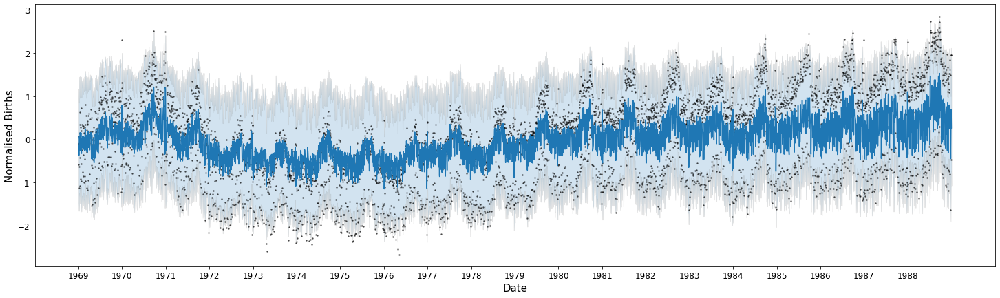

Test


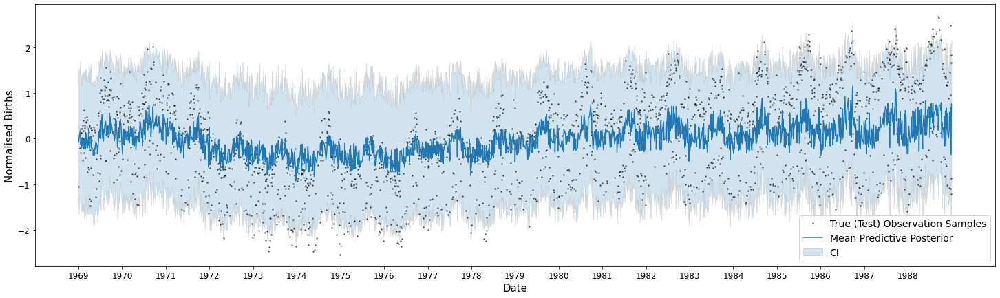

train ELBO, MSE, MAE:  -4515.645271992608 0.396352783735225 0.5254650704519637
test ELBO, MSE, MAE:  -5195.8858627038935 0.7179232997059299 0.7139534512755056
percentage out of CI (train, test):  2.034030901623313 6.25


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7579086577564417
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.3262002630053997
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.44233244e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.2319877...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[0.73661317, 0., 0...."


--------------------------------------------------------
l Distribution:  tfp.distributions.InverseGamma("InverseGamma", batch_shape=[], event_shape=[], dtype=float64)
Train


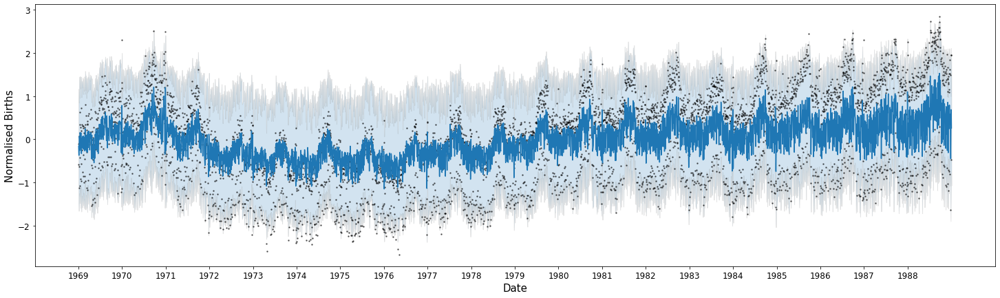

Test


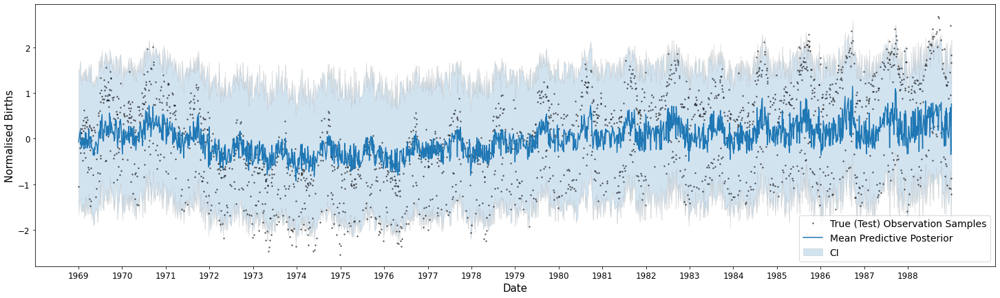

train ELBO, MSE, MAE:  -4515.642037070653 0.3963523526924564 0.5254647675833141
test ELBO, MSE, MAE:  -5195.880093660562 0.7179217876052888 0.7139527066224323
percentage out of CI (train, test):  2.034030901623313 6.25


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7579087855427921
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.3262133732435968
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.44233165e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.23198853...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[0.73661266, 0., 0...."


--------------------------------------------------------
l Distribution:  tfp.distributions.Gamma("Gamma", batch_shape=[], event_shape=[], dtype=float64)
Train


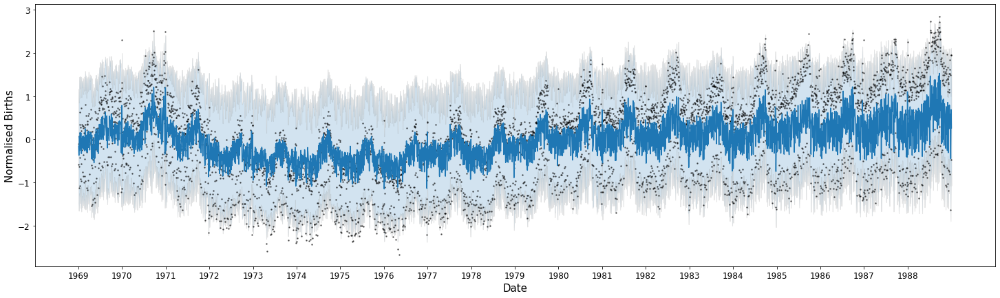

Test


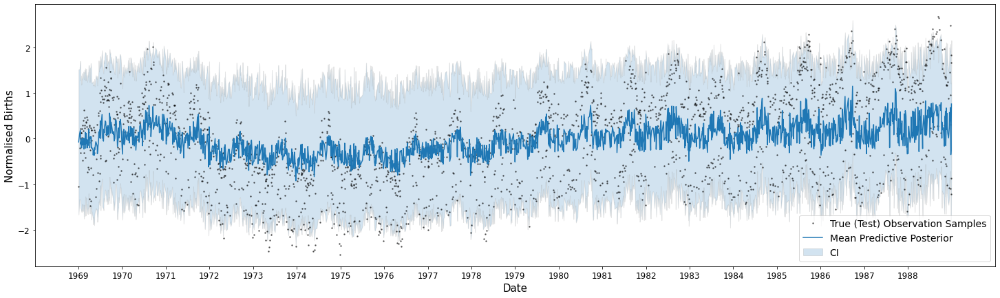

train ELBO, MSE, MAE:  -4515.6470908610745 0.39635303021048607 0.5254652410263925
test ELBO, MSE, MAE:  -5195.889078643248 0.7179241345848606 0.7139538613699167
percentage out of CI (train, test):  2.034030901623313 6.25


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7579086014933083
SVGP.kernel.lengthscales,Parameter,Softplus,Gamma,True,(),float64,1.3261929190260726
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.44233281e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.23198728...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[0.73661343, 0., 0...."


--------------------------------------------------------
l Distribution:  tfp.distributions.Gamma("Gamma", batch_shape=[], event_shape=[], dtype=float64)
Train


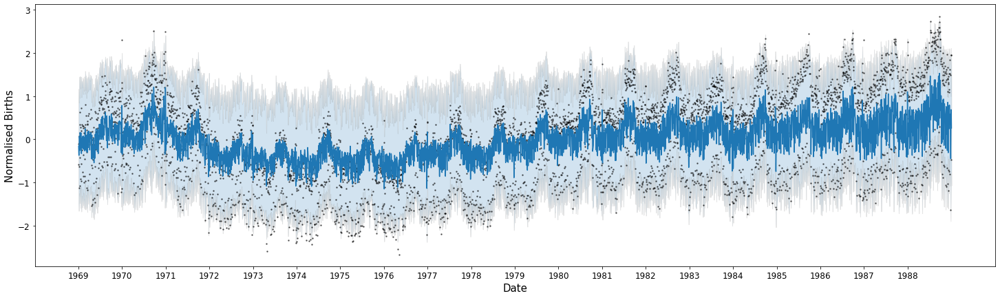

Test


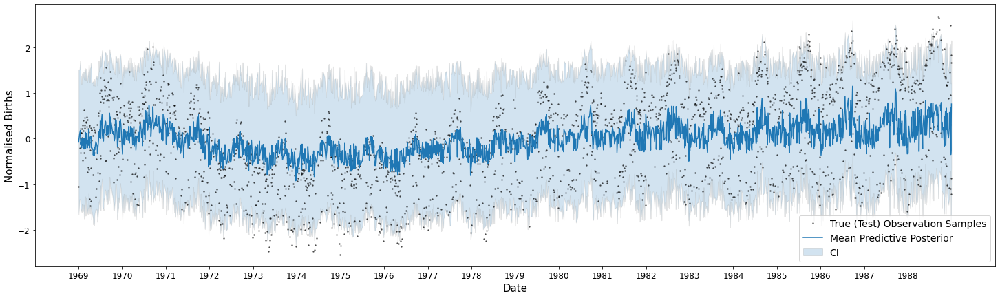

train ELBO, MSE, MAE:  -4515.65205618103 0.3963537187823457 0.5254657174845907
test ELBO, MSE, MAE:  -5195.897776280989 0.7179264010340014 0.7139549820142913
percentage out of CI (train, test):  2.034030901623313 6.25


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7579084355109174
SVGP.kernel.lengthscales,Parameter,Softplus,Gamma,True,(),float64,1.3261729322605016
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.44233370e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.23198611...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[0.73661416, 0., 0...."


--------------------------------------------------------


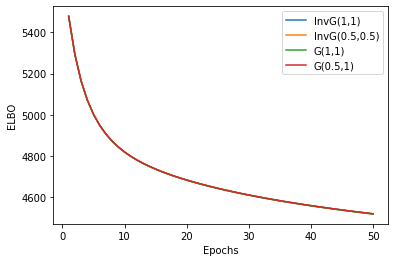

In [13]:
l_dists = [
    tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1)),
    tfp.distributions.InverseGamma(to_default_float(0.5), to_default_float(0.5)), 
    tfp.distributions.Gamma(to_default_float(1), to_default_float(1)),
    tfp.distributions.Gamma(to_default_float(0.5), to_default_float(1)),
]

elbos = [];

for l_dist in l_dists:
    print('l Distribution: ', l_dist)
    kernel = gpflow.kernels.RBF(lengthscales = 1, variance = 1)
    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), 3000)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=3000)
    set_trainable(model.likelihood.variance, False)
    model.kernel.lengthscales.prior = l_dist
    model.kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    elbos.append(optimise_predict_model(model))
    print('--------------------------------------------------------')

fig = plt.figure()
xs = np.linspace(1,50, 50)
plt.plot(xs, elbos[0], '-', label='InvG(1,1)')
plt.plot(xs, elbos[1], '-', label='InvG(0.5,0.5)')
plt.plot(xs, elbos[2], '-', label='G(1,1)')
plt.plot(xs, elbos[3], '-', label='G(0.5,1)')
plt.xlabel('Epochs')
plt.ylabel('ELBO')
plt.legend()
plt.show()

Try the same buth with starting condition l=5

l Distribution:  tfp.distributions.InverseGamma("InverseGamma", batch_shape=[], event_shape=[], dtype=float64)


2022-08-14 16:49:10.693566: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
2022-08-14 16:49:18.489546: I tensorflow/core/util/cuda_solvers.cc:179] Creating GpuSolver handles for stream 0x79f7f20


Train


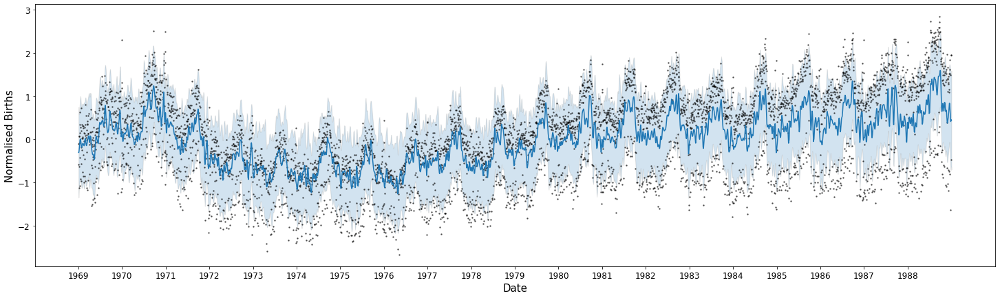

Test


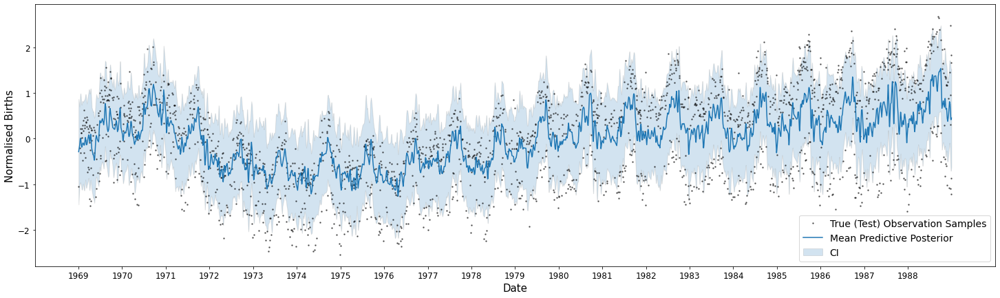

train ELBO, MSE, MAE:  -4215.233928963883 0.5223317786134475 0.6058944520954346
test ELBO, MSE, MAE:  -4518.242611969922 0.692791142337955 0.7009813370380222
percentage out of CI (train, test):  24.467044787795814 29.1514598540146


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7745257759848077
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,5.466933121284838
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.77964777e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.33912424...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[6.20426018e-001, 0.00000000e+000, 0.00000000e+000..."


--------------------------------------------------------
l Distribution:  tfp.distributions.InverseGamma("InverseGamma", batch_shape=[], event_shape=[], dtype=float64)
Train


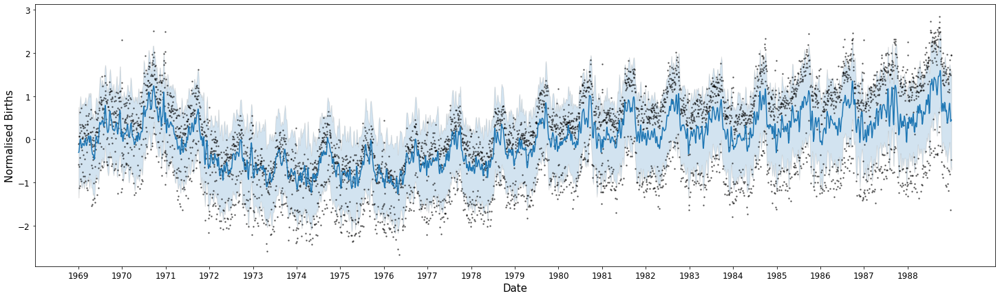

Test


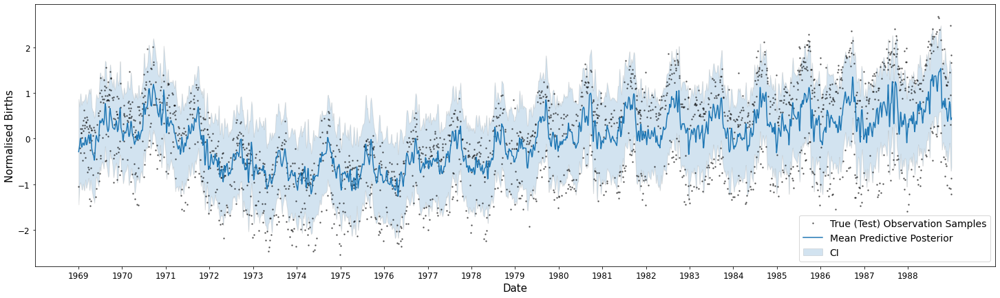

train ELBO, MSE, MAE:  -4215.232178835139 0.5223317391388292 0.6058944528429776
test ELBO, MSE, MAE:  -4518.23951948187 0.6927904346610237 0.7009809989161225
percentage out of CI (train, test):  24.467044787795814 29.1514598540146


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7745258441216828
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,5.466966895777724
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.77962853e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.33912405...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[6.20426196e-001, 0.00000000e+000, 0.00000000e+000..."


--------------------------------------------------------
l Distribution:  tfp.distributions.Gamma("Gamma", batch_shape=[], event_shape=[], dtype=float64)
Train


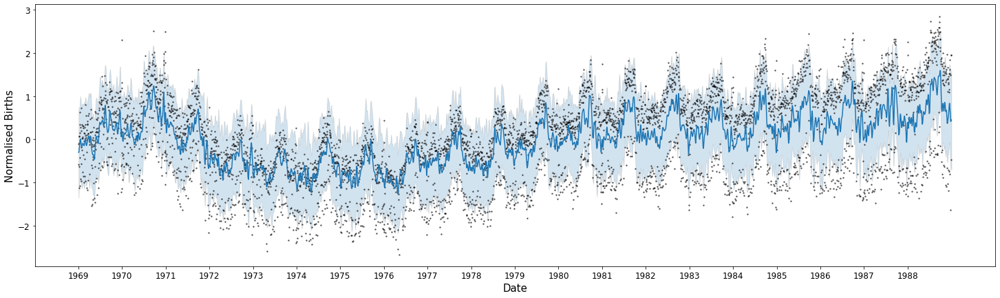

Test


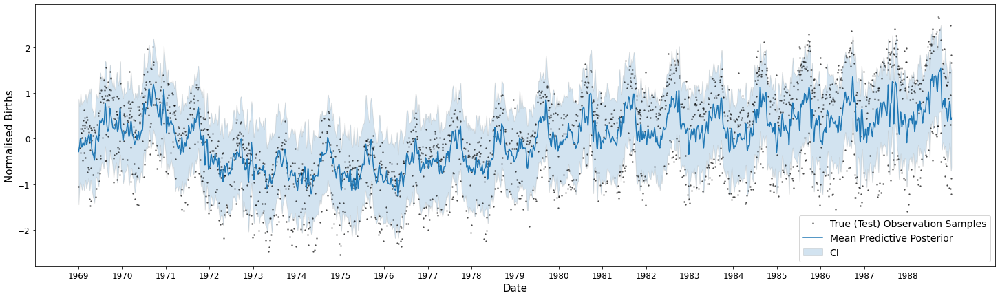

train ELBO, MSE, MAE:  -4215.252578247676 0.5223322439877042 0.6058945170499607
test ELBO, MSE, MAE:  -4518.275959337313 0.6927989202656057 0.7009851596511588
percentage out of CI (train, test):  24.467044787795814 29.1514598540146


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7745250807288676
SVGP.kernel.lengthscales,Parameter,Softplus,Gamma,True,(),float64,5.4665731152459704
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.77985220e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.33912623...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[6.20424177e-001, 0.00000000e+000, 0.00000000e+000..."


--------------------------------------------------------
l Distribution:  tfp.distributions.Gamma("Gamma", batch_shape=[], event_shape=[], dtype=float64)
Train


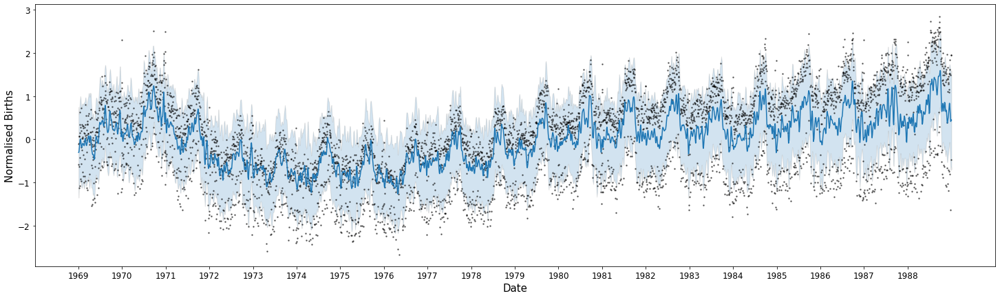

Test


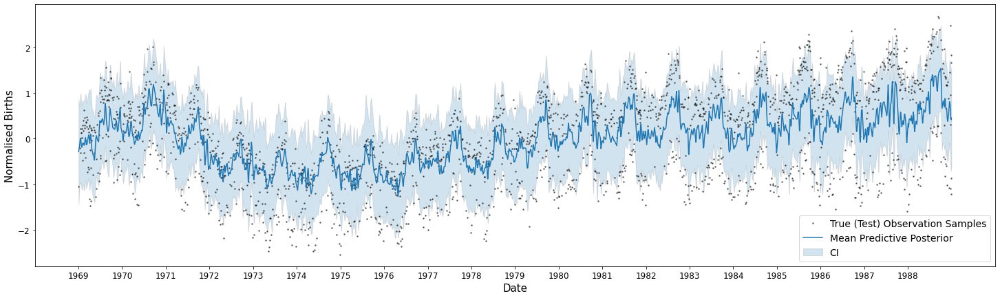

train ELBO, MSE, MAE:  -4215.254695944765 0.5223322906640361 0.6058945202130536
test ELBO, MSE, MAE:  -4518.279785133488 0.692799823191645 0.700985603906783
percentage out of CI (train, test):  24.467044787795814 29.1514598540146


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7745249974908521
SVGP.kernel.lengthscales,Parameter,Softplus,Gamma,True,(),float64,5.46653224230422
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.77987550e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.33912646...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[6.20423960e-001, 0.00000000e+000, 0.00000000e+000..."


--------------------------------------------------------


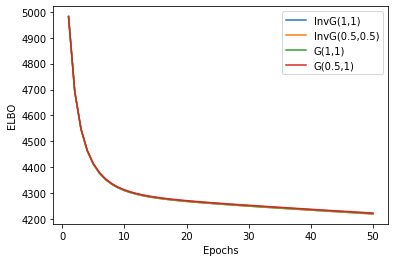

In [4]:
l_dists = [
    tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1)),
    tfp.distributions.InverseGamma(to_default_float(0.5), to_default_float(0.5)), 
    tfp.distributions.Gamma(to_default_float(1), to_default_float(1)),
    tfp.distributions.Gamma(to_default_float(0.5), to_default_float(1)),
]

elbos = [];

for l_dist in l_dists:
    print('l Distribution: ', l_dist)
    kernel = gpflow.kernels.RBF(lengthscales = 5, variance = 1)
    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), 3000)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=3000)
    set_trainable(model.likelihood.variance, False)
    model.kernel.lengthscales.prior = l_dist
    model.kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    elbos.append(optimise_predict_model(model))
    print('--------------------------------------------------------')

fig = plt.figure()
xs = np.linspace(1,50, 50)
plt.plot(xs, elbos[0], '-', label='InvG(1,1)')
plt.plot(xs, elbos[1], '-', label='InvG(0.5,0.5)')
plt.plot(xs, elbos[2], '-', label='G(1,1)')
plt.plot(xs, elbos[3], '-', label='G(0.5,1)')
plt.xlabel('Epochs')
plt.ylabel('ELBO')
plt.legend()
plt.show()

Different Starting values

l starting value:  1
Train


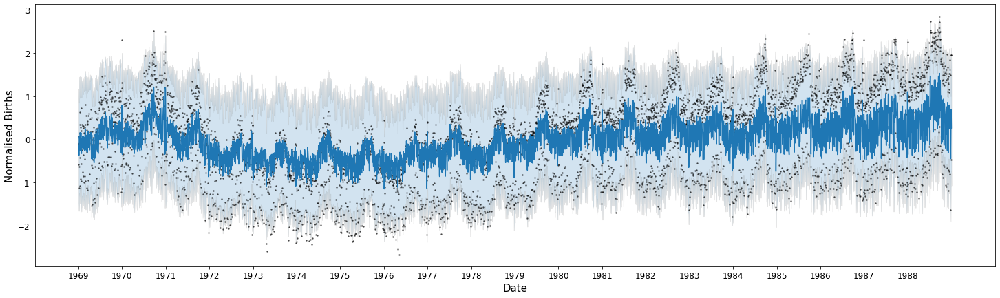

Test


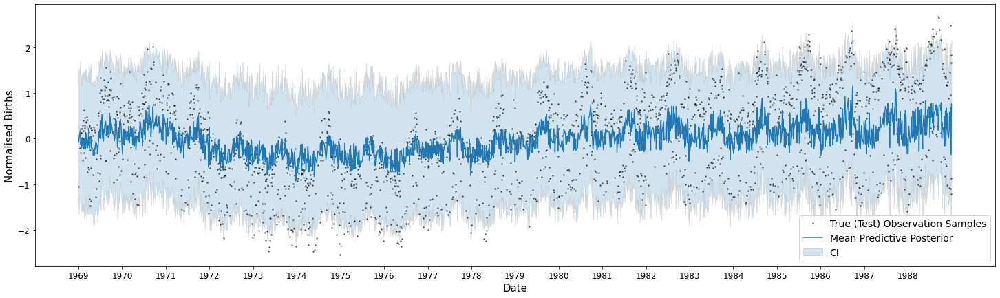

train ELBO, MSE, MAE:  -4515.645271992608 0.396352783735225 0.5254650704519637
test ELBO, MSE, MAE:  -5195.8858627038935 0.7179232997059299 0.7139534512755056
percentage out of CI (train, test):  2.034030901623313 6.25


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7579086577564417
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,1.3262002630053997
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[2.44233244e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.2319877...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[0.73661317, 0., 0...."


--------------------------------------------------------
l starting value:  3
Train


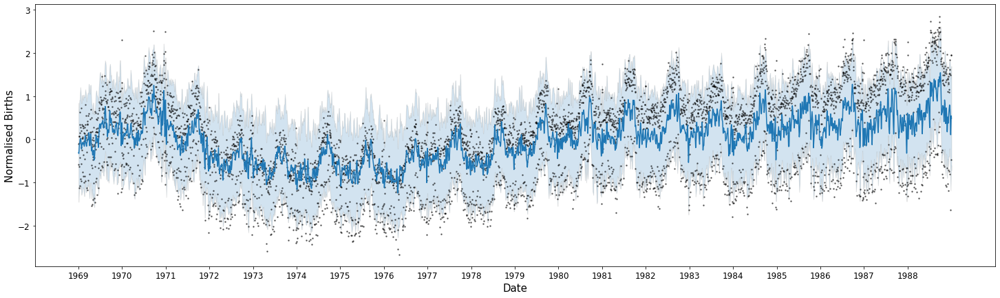

Test


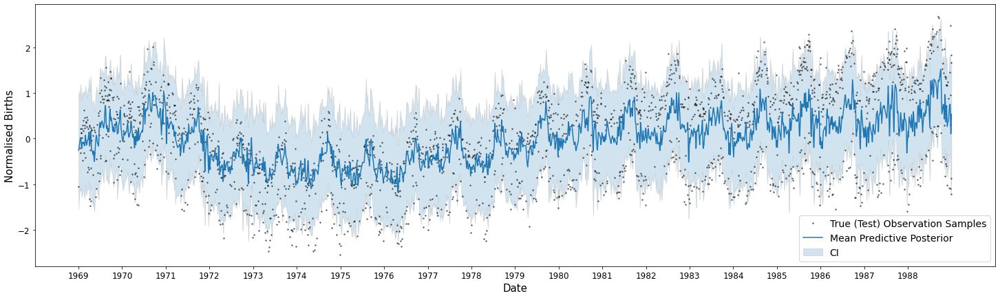

train ELBO, MSE, MAE:  -4342.303436759104 0.5032477708861609 0.5937674918475572
test ELBO, MSE, MAE:  -4776.083664936181 0.7354846093018097 0.7228881305782217
percentage out of CI (train, test):  16.370037160179933 21.897810218978105


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7709092004307518
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,3.4366441453953587
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.75550776e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.33344608...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[6.84397310e-001, 0.00000000e+000, 0.00000000e+000..."


--------------------------------------------------------
l starting value:  5
Train


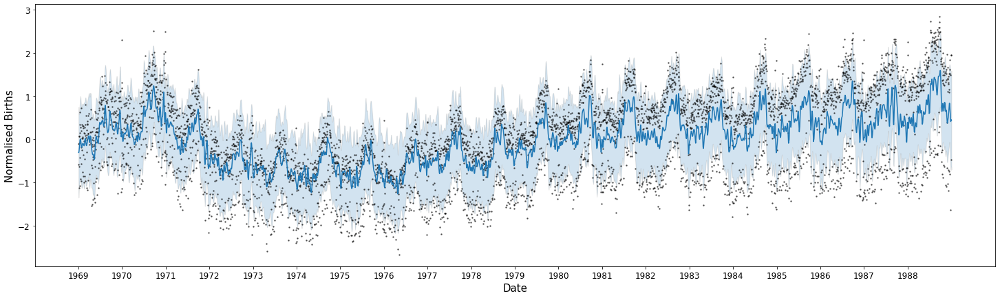

Test


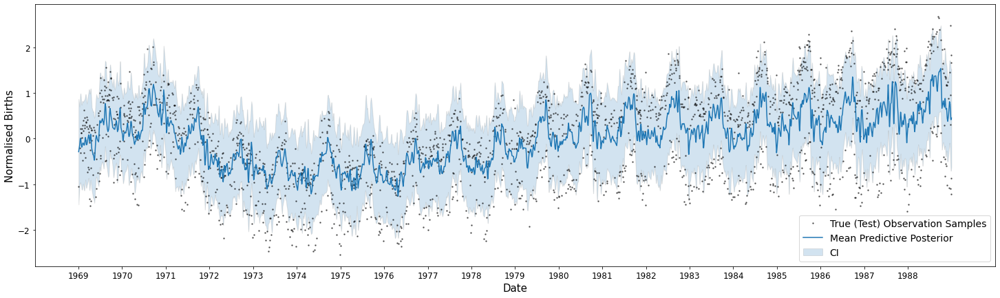

train ELBO, MSE, MAE:  -4215.233928963883 0.5223317786134475 0.6058944520954346
test ELBO, MSE, MAE:  -4518.242611969922 0.692791142337955 0.7009813370380222
percentage out of CI (train, test):  24.467044787795814 29.1514598540146


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7745257759848077
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,5.466933121284838
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.77964777e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.33912424...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[6.20426018e-001, 0.00000000e+000, 0.00000000e+000..."


--------------------------------------------------------
l starting value:  7
Train


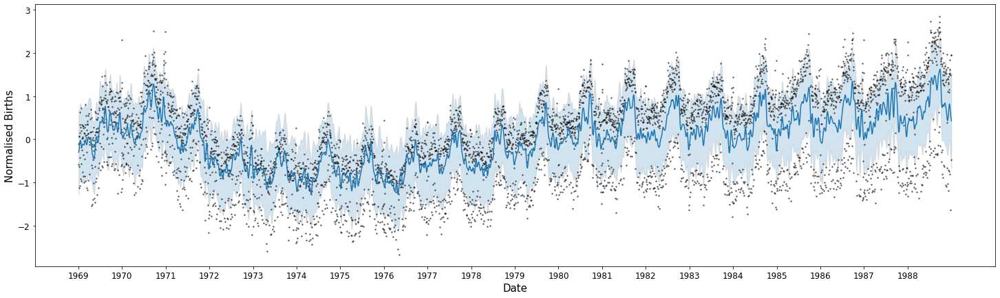

Test


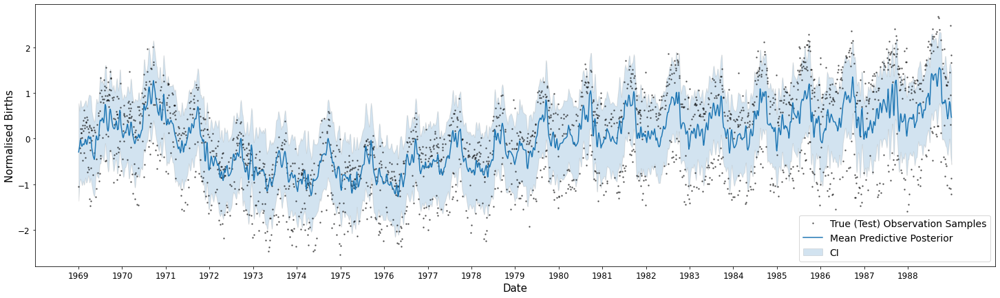

train ELBO, MSE, MAE:  -4128.6123126994935 0.5261769692440849 0.6090785346318901
test ELBO, MSE, MAE:  -4360.747462136867 0.6604616462750367 0.6846468713542824
percentage out of CI (train, test):  29.70858595736358 33.85036496350365


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7788158301676859
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,7.463611842120564
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.81738877e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.33604315...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[5.77331397e-001, 0.00000000e+000, 0.00000000e+000..."


--------------------------------------------------------
l starting value:  10
Train


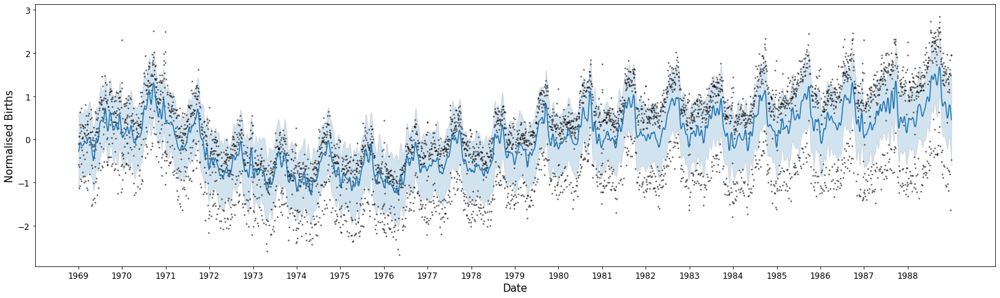

Test


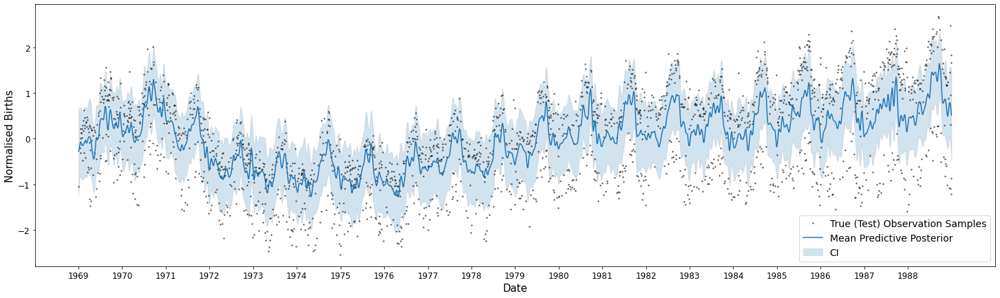

train ELBO, MSE, MAE:  -4042.04746188278 0.5297075837885653 0.6126330398461287
test ELBO, MSE, MAE:  -4216.596024493814 0.6335815790365003 0.6712591961819364
percentage out of CI (train, test):  35.39996088402112 38.64051094890511


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7839321121518944
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,10.455875900992723
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.87966360e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.31319393...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[5.31393192e-001, 0.00000000e+000, 0.00000000e+000..."


--------------------------------------------------------


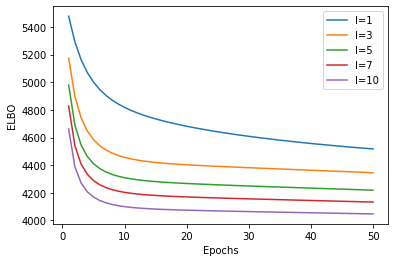

In [5]:
ls = [1, 3, 5, 7, 10]

elbos = [];

for l in ls:
    print('l starting value: ', l)
    kernel = gpflow.kernels.RBF(lengthscales = l, variance = 1)
    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), 3000)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=3000)
    set_trainable(model.likelihood.variance, False)
    model.kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    elbos.append(optimise_predict_model(model))
    print('--------------------------------------------------------')

fig = plt.figure()
xs = np.linspace(1,50, 50)
plt.plot(xs, elbos[0], '-', label='l=1')
plt.plot(xs, elbos[1], '-', label='l=3')
plt.plot(xs, elbos[2], '-', label='l=5')
plt.plot(xs, elbos[3], '-', label='l=7')
plt.plot(xs, elbos[4], '-', label='l=10')
plt.xlabel('Epochs')
plt.ylabel('ELBO')
plt.legend()
plt.show()

l starting value:  10
Train


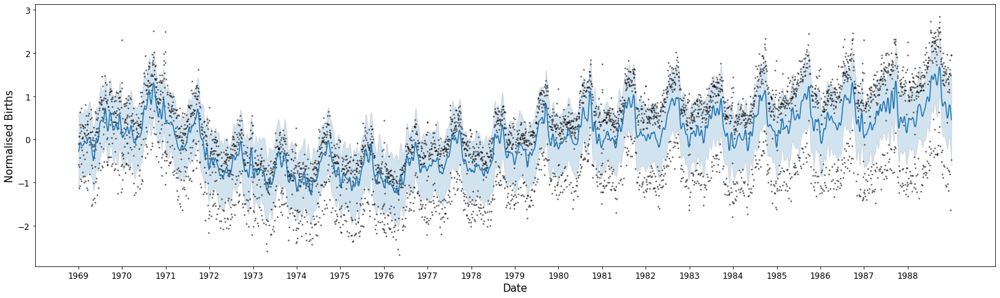

Test


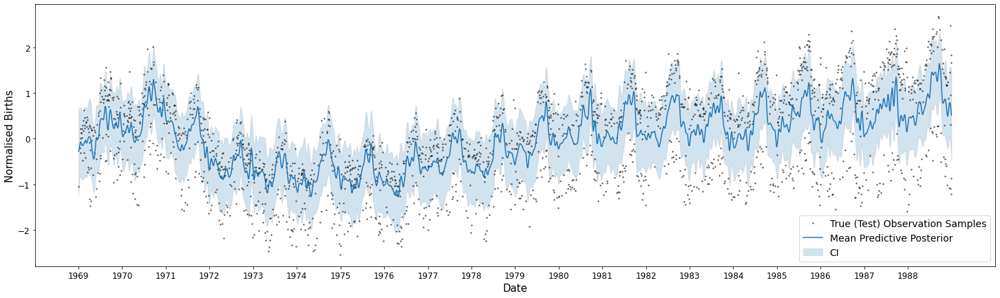

train ELBO, MSE, MAE:  -4042.04746188278 0.5297075837885653 0.6126330398461287
test ELBO, MSE, MAE:  -4216.596024493814 0.6335815790365003 0.6712591961819364
percentage out of CI (train, test):  35.39996088402112 38.64051094890511


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7839321121518944
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,10.455875900992723
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.87966360e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.31319393...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[5.31393192e-001, 0.00000000e+000, 0.00000000e+000..."


--------------------------------------------------------
l starting value:  20
Train


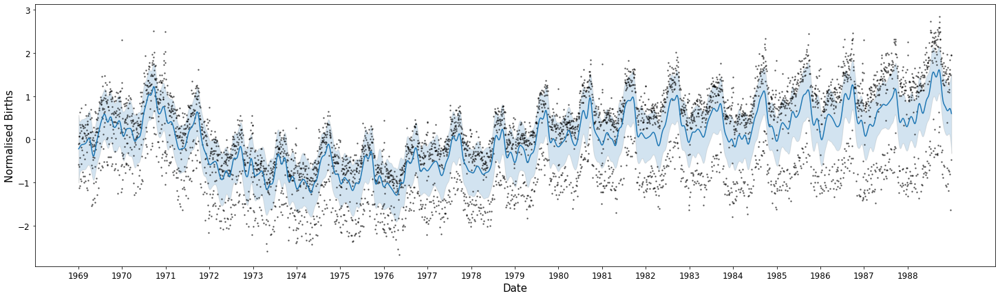

Test


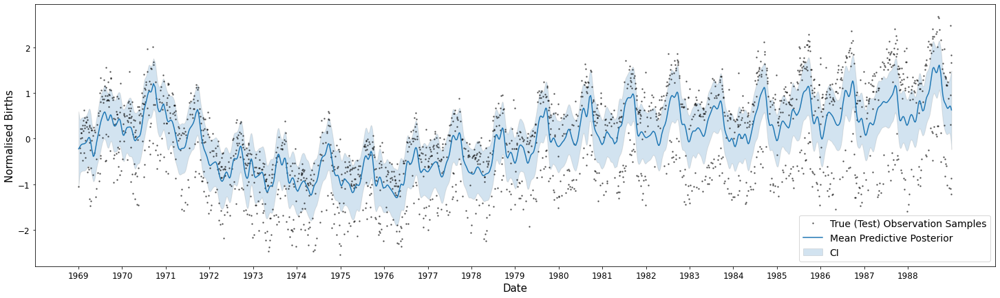

train ELBO, MSE, MAE:  -3901.236509831869 0.5387432815658135 0.6195539244545675
test ELBO, MSE, MAE:  -4002.9997276820154 0.6020043825378025 0.6549745127042687
percentage out of CI (train, test):  48.44513983962449 49.77189781021898


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7947141355589292
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,20.436803603702234
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.96041025e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-2.46435675e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[4.48287359e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------
l starting value:  50
Train


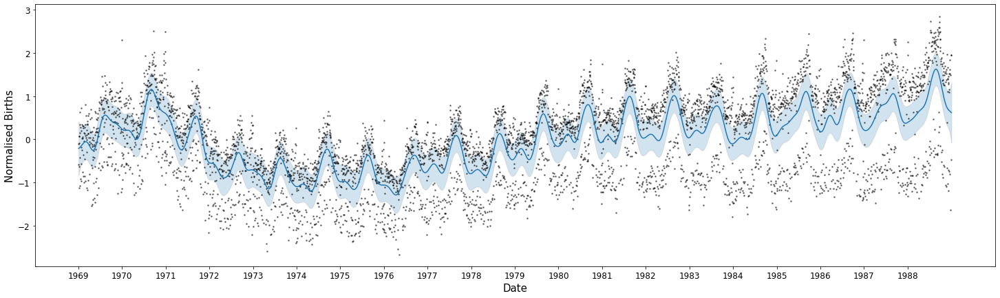

Test


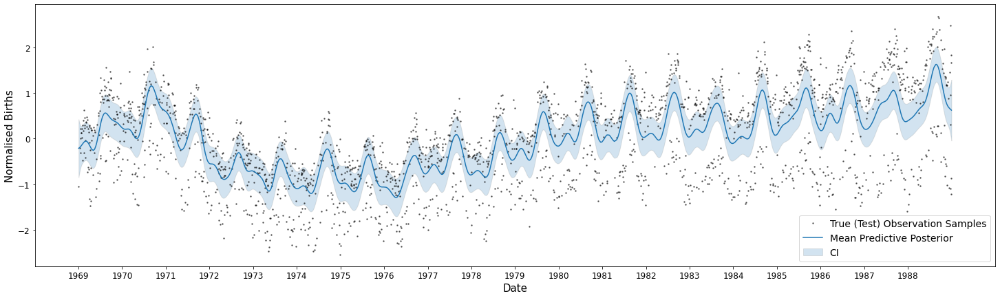

train ELBO, MSE, MAE:  -3773.874507459451 0.5499748157858408 0.6246654650519035
test ELBO, MSE, MAE:  -3831.5471608948565 0.5873222818787412 0.6447592990469841
percentage out of CI (train, test):  67.00567181693722 67.19890510948905


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.8124748792108103
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,50.41442810048017
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.82197955e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-2.32969470e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[3.53374122e-01, 0.00000000e+00, 0.00000000e+00..."


--------------------------------------------------------


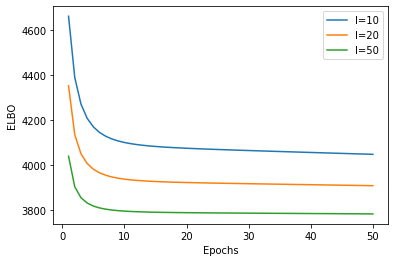

In [6]:
ls = [10, 20, 50]

elbos = [];

for l in ls:
    print('l starting value: ', l)
    kernel = gpflow.kernels.RBF(lengthscales = l, variance = 1)
    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), 3000)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=3000)
    set_trainable(model.likelihood.variance, False)
    model.kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    elbos.append(optimise_predict_model(model))
    print('--------------------------------------------------------')

fig = plt.figure()
xs = np.linspace(1,50, 50)
plt.plot(xs, elbos[0], '-', label='l=10')
plt.plot(xs, elbos[1], '-', label='l=20')
plt.plot(xs, elbos[2], '-', label='l=50')
plt.xlabel('Epochs')
plt.ylabel('ELBO')
plt.legend()
plt.show()

Don't train Z

Number of inducing points:  1000
Train


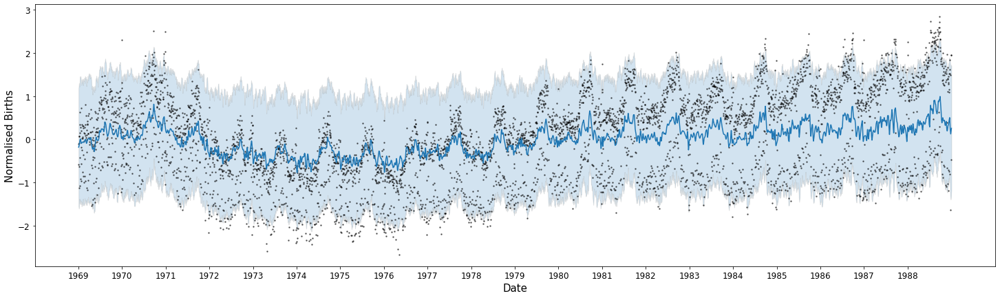

Test


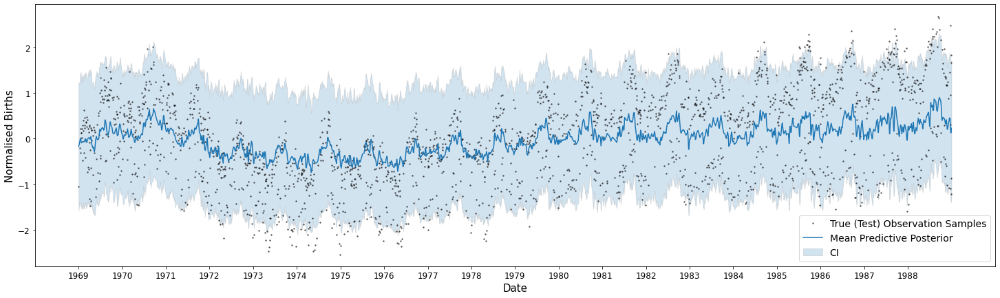

train ELBO, MSE, MAE:  -1604.74479321417 0.6502048407892841 0.6763590683760545
test ELBO, MSE, MAE:  -1678.4880420244099 0.7685010431133306 0.7412798433968965
percentage out of CI (train, test):  6.825738314101311 9.124087591240876


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.740235573003145
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,3.489862657425596
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,False,"(1000, 1)",float64,[[2.00000000e+00...
SVGP.q_mu,Parameter,Identity,,False,"(1000, 1)",float64,[[-2.11605478e-01...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 1000, 1000)",float64,"[[[0.81439782, 0., 0...."


--------------------------------------------------------
Number of inducing points:  2000
Train


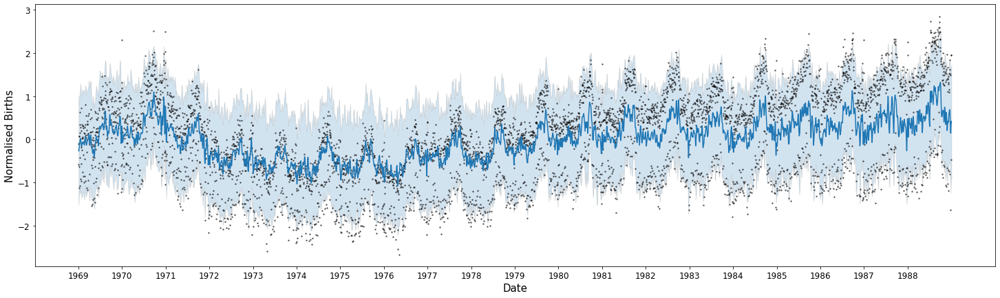

Test


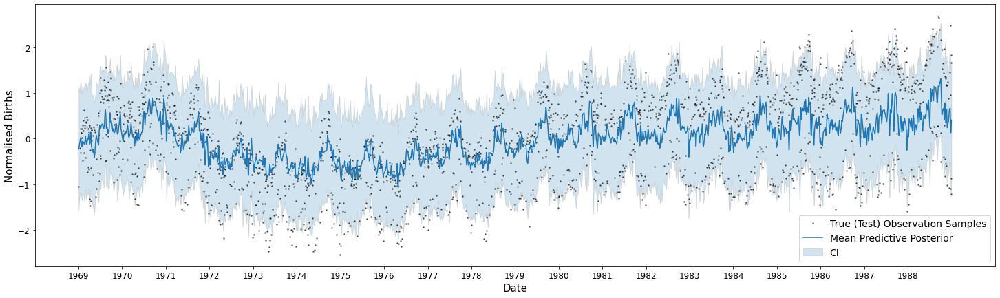

train ELBO, MSE, MAE:  -3003.7360814313815 0.549986421766003 0.6215383525623295
test ELBO, MSE, MAE:  -3255.4322545924474 0.747437011212831 0.7298156448166081
percentage out of CI (train, test):  12.908273029532563 16.697080291970803


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7596511394165216
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,3.470367607331464
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,False,"(2000, 1)",float64,[[2.00000000e+00...
SVGP.q_mu,Parameter,Identity,,False,"(2000, 1)",float64,[[-0.29342338...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 2000, 2000)",float64,"[[[0.73091231, 0., 0...."


--------------------------------------------------------
Number of inducing points:  3000
Train


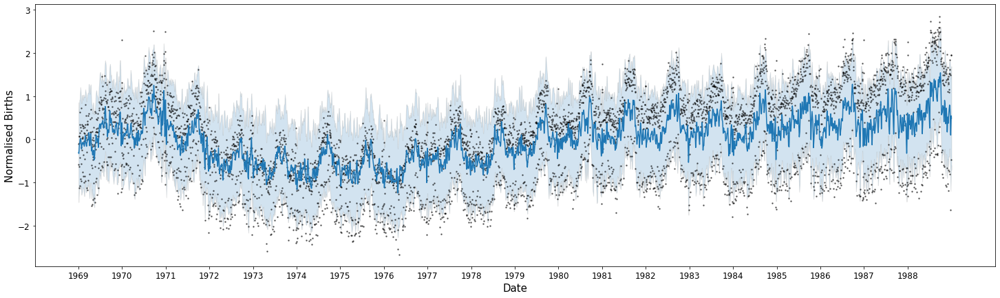

Test


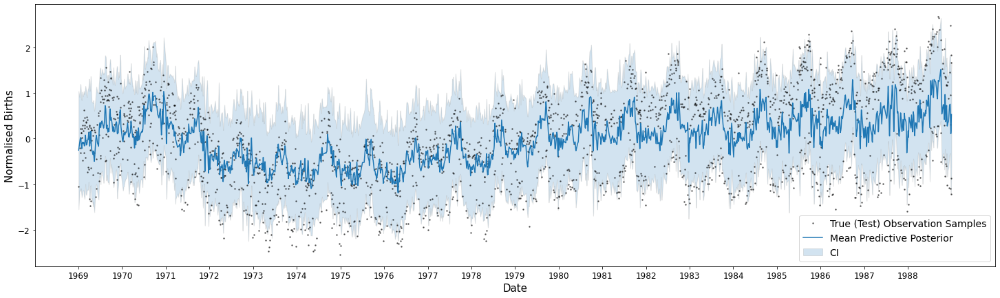

train ELBO, MSE, MAE:  -4343.439668534986 0.5032803783075811 0.5938164799837784
test ELBO, MSE, MAE:  -4777.212231969779 0.7352977051844999 0.7228221722117272
percentage out of CI (train, test):  16.233131234109134 21.76094890510949


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.770944780108949
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,3.424443732709412
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,False,"(3000, 1)",float64,[[2.00000000e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.34237631...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[6.69589366e-001, 0.00000000e+000, 0.00000000e+000..."


--------------------------------------------------------


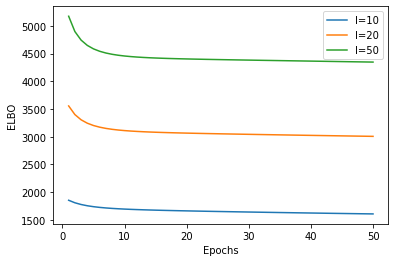

In [9]:
Ms = [1000, 2000, 3000]

elbos = [];

for M in Ms:
    print('Number of inducing points: ', M)
    kernel = gpflow.kernels.RBF(lengthscales = 3, variance = 1)
    Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
    model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
    set_trainable(model.likelihood.variance, False)
    set_trainable(model.inducing_variable.Z, False)
    model.kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
    model.kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))

    elbos.append(optimise_predict_model(model))
    print('--------------------------------------------------------')

fig = plt.figure()
xs = np.linspace(1,50, 50)
plt.plot(xs, elbos[0], '-', label='l=10')
plt.plot(xs, elbos[1], '-', label='l=20')
plt.plot(xs, elbos[2], '-', label='l=50')
plt.xlabel('Epochs')
plt.ylabel('ELBO')
plt.legend()
plt.show()

Training vs not training Z

Train Z
Train


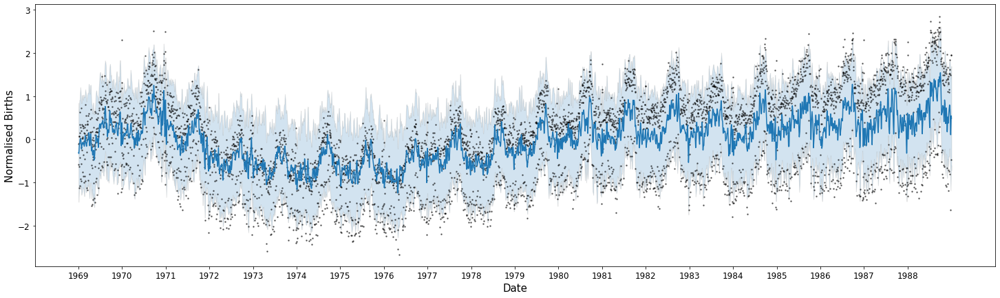

Test


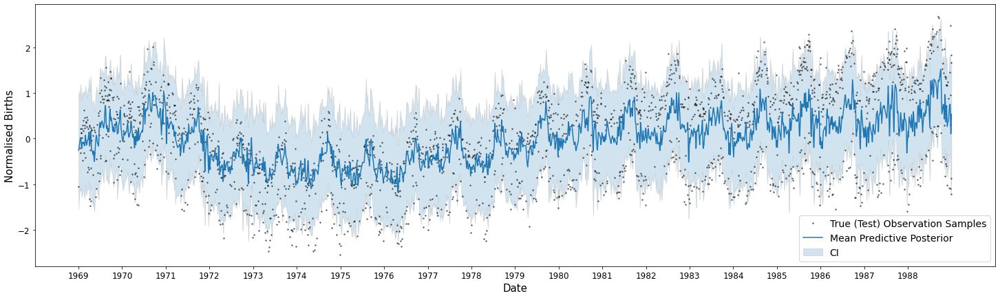

train ELBO, MSE, MAE:  -4342.303436759104 0.5032477708861609 0.5937674918475572
test ELBO, MSE, MAE:  -4776.083664936181 0.7354846093018097 0.7228881305782217
percentage out of CI (train, test):  16.370037160179933 21.897810218978105


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.7709092004307518
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,3.4366441453953587
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,True,"(3000, 1)",float64,[[1.75550776e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.33344608...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[6.84397310e-001, 0.00000000e+000, 0.00000000e+000..."


--------------------------------------------------------
Dont train Z
Train


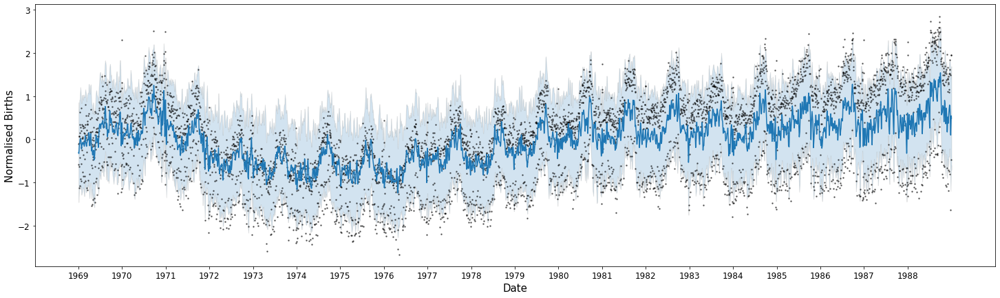

Test


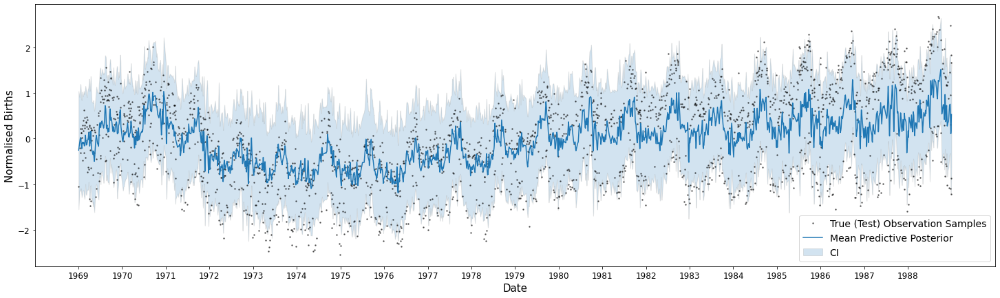

train ELBO, MSE, MAE:  -4343.439668534986 0.5032803783075811 0.5938164799837784
test ELBO, MSE, MAE:  -4777.212231969779 0.7352977051844999 0.7228221722117272
percentage out of CI (train, test):  16.233131234109134 21.76094890510949


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.770944780108949
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,3.424443732709412
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,False,"(3000, 1)",float64,[[2.00000000e+00...
SVGP.q_mu,Parameter,Identity,,False,"(3000, 1)",float64,[[-0.34237631...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 3000, 3000)",float64,"[[[6.69589366e-001, 0.00000000e+000, 0.00000000e+000..."


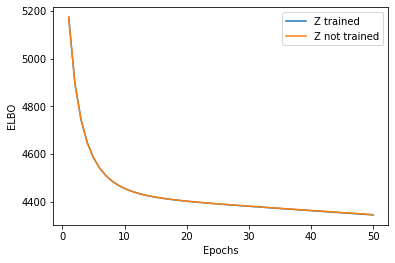

In [10]:
elbos = []
M = 3000

print('Train Z')
kernel = gpflow.kernels.RBF(lengthscales = 3, variance = 1)
Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
model1 = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
set_trainable(model1.likelihood.variance, False)
set_trainable(model1.inducing_variable.Z, True)
model1.kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
model1.kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
elbos.append(optimise_predict_model(model1))

print('--------------------------------------------------------')

print('Dont train Z')
kernel = gpflow.kernels.RBF(lengthscales = 3, variance = 1)
Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
model2 = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
set_trainable(model2.likelihood.variance, False)
set_trainable(model2.inducing_variable.Z, False)
model2.kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
model2.kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
elbos.append(optimise_predict_model(model2))

fig = plt.figure()
xs = np.linspace(1,50, 50)
plt.plot(xs, elbos[0], '-', label='Z trained')
plt.plot(xs, elbos[1], '-', label='Z not trained')
plt.xlabel('Epochs')
plt.ylabel('ELBO')
plt.legend()
plt.show()

Try the set up: epochs=1000, l=10, M=1500

Train


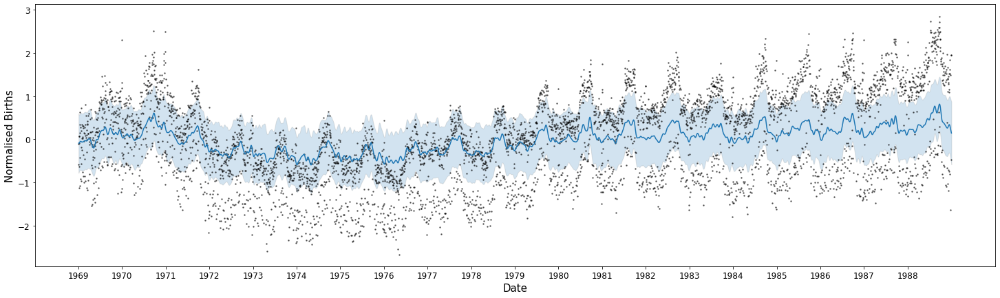

Test


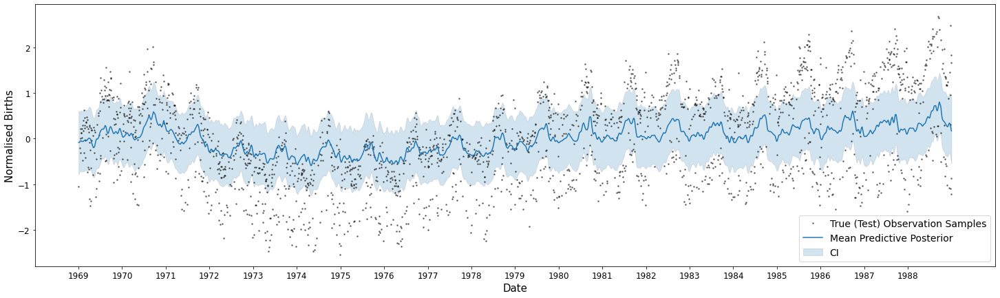

train ELBO, MSE, MAE:  -2081.308534656246 0.6911386517858082 0.6982747282561099
test ELBO, MSE, MAE:  -2132.432359014912 0.7556381661007773 0.7348599800472485
percentage out of CI (train, test):  50.772540582828086 51.96167883211679


name,class,transform,prior,trainable,shape,dtype,value
SVGP.kernel.variance,Parameter,Softplus,Gamma,True,(),float64,0.16243643902698796
SVGP.kernel.lengthscales,Parameter,Softplus,InverseGamma,True,(),float64,8.529782856531108
SVGP.likelihood.variance,Parameter,Softplus + Shift,,False,(),float64,1.0
SVGP.inducing_variable.Z,Parameter,Identity,,False,"(1500, 1)",float64,[[2.00000000e+00...
SVGP.q_mu,Parameter,Identity,,False,"(1500, 1)",float64,[[-0.21844592...
SVGP.q_sqrt,Parameter,FillTriangular,,False,"(1, 1500, 1500)",float64,"[[[8.72431821e-001, 0.00000000e+000, 0.00000000e+000..."


No handles with labels found to put in legend.


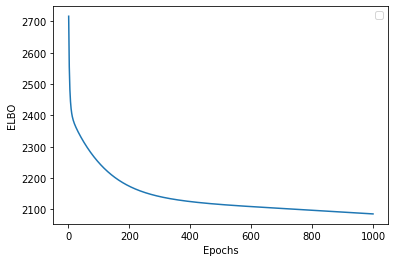

In [12]:
M = 1500
kernel = gpflow.kernels.RBF(lengthscales = 3, variance = 1)
Z = np.linspace(x_train.numpy().min(), x_train.numpy().max(), M)[:, None]
model = gpflow.models.SVGP(kernel, gpflow.likelihoods.Gaussian(), Z, mean_function=gpflow.mean_functions.Zero(), num_data=M)
set_trainable(model.likelihood.variance, False)
set_trainable(model.inducing_variable.Z, False)
model.kernel.lengthscales.prior = tfp.distributions.InverseGamma(to_default_float(1), to_default_float(1))
model.kernel.variance.prior = tfp.distributions.Gamma(to_default_float(1), to_default_float(1))
elbos, ls = optimise_predict_model(model, epochs=1000)

fig, ax = plt.subplots(1,2, figsize=(7,5))
xs = np.linspace(1,1000, 1000)
ax[0].plot(xs, elbos, '-')
ax[1].plot(xs, ls, '-')
ax[0].set_xlabel('Epochs')
ax[1].set_xlabel('Epochs')
ax[0].set_ylabel('ELBO')
ax[1].set_ylabel('lengthscales')
plt.show()